In [1]:
import geopandas as gpd
from tqdm import tqdm
import pandas as pd
import os
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [2]:
output_path = './Multi_F_Results'

In [3]:
state_lookup = pd.read_csv('./census_geometry/state_lookup.csv')

# mi = gpd.read_file(os.path.join(output_path, 'MH_F_mi_all.geojson'))

mi = gpd.GeoDataFrame()
for i in range(0, 19):
    if i != 17:
        temp_path = os.path.join(output_path, f'N_{i}', f'Multi_F_mi.geojson')
        if os.path.exists(temp_path):
            temp_ = gpd.read_file(temp_path)
            temp_['iter'] = i
            mi = pd.concat([mi, temp_], ignore_index=True)
    else:    
        for ii in range(0, 6):
            temp_path = os.path.join(output_path, f'N_17', f'N_{ii}', f'NH_F_mi.geojson')
            if os.path.exists(temp_path):
                temp_ = gpd.read_file(temp_path)
                temp_['iter'] = i
                mi = pd.concat([mi, temp_], ignore_index=True)

# mi.to_file(os.path.join(output_path, 'MH_F_mi_all.geojson'))

mi = mi.fillna(0)
mi['STATE'] = mi.apply(lambda x:x['ID'][0:2], axis=1)
mi = mi.merge(state_lookup, left_on='STATE', right_on='Abbr', how='left')

mi.head()

,ID,LAT,LON,NAME,LIBRARY_ID,LIBRARY_TYPE,MH_F,IH_F,TAS_F,SS_F,...,pval_GROUPQ,dist_GROUPQ,geometry,iter,STATE,Name,Abbr,FIPS,ContiguousUS,Region
0,CA10114,36.416309,-119.003224,TERMINUS DAM,199,dam_study,True,False,True,True,...,1.477466e-01,25000,POINT (-119.00322 36.41631),0,CA,California,CA,6,1,Pacific
1,CA10113,36.060671,-118.919340,Richard L. Schafer Dam,98,dam_study,True,False,True,True,...,6.966340e-07,25000,POINT (-118.91934 36.06067),0,CA,California,CA,6,1,Pacific
2,NY00468,42.733294,-77.907232,MOUNT MORRIS DAM,316,dam_study,True,False,True,True,...,0.000000e+00,2500,POINT (-77.90723 42.73329),0,NY,New York,NY,36,1,MiddleAtlantic
3,CA10109,38.151041,-120.813699,NEW HOGAN DAM,297,dam_study,True,False,True,True,...,1.231008e-03,25000,POINT (-120.81370 38.15104),0,CA,California,CA,6,1,Pacific
4,CA10104,37.906801,-120.934059,FARMINGTON DAM,260,dam_study,True,False,True,True,...,0.000000e+00,2500,POINT (-120.93406 37.90680),0,CA,California,CA,6,1,Pacific


In [4]:
# lm = gpd.read_file(os.path.join(output_path, 'MH_F_lm_all.geojson'))
# mi = gpd.read_file(os.path.join(output_path, 'MH_F_mi_all.geojson'))
'''
lm = gpd.GeoDataFrame()

for i in range(0, 19):
    print(i)
    if i != 17:
        temp_path = os.path.join(output_path, f'N_{i}', f'MH_F_lm.geojson')
        if os.path.exists(temp_path):
            temp_ = gpd.read_file(temp_path)
            temp_['iter'] = i
            lm = pd.concat([lm, temp_], ignore_index=True)
    else:    
        for ii in range(0, 6):
            temp_path = os.path.join(output_path, f'N_17', f'N_{ii}', f'MH_F_lm.geojson')
            if os.path.exists(temp_path):
                temp_ = gpd.read_file(temp_path)
                temp_['iter'] = i
                lm = pd.concat([lm, temp_], ignore_index=True)
                
lm.to_file(os.path.join(output_path, 'MH_F_lm_all.geojson'))         
lm
'''


"\nlm = gpd.GeoDataFrame()\n\nfor i in range(0, 19):\n    print(i)\n    if i != 17:\n        temp_path = os.path.join(output_path, f'N_{i}', f'MH_F_lm.geojson')\n        if os.path.exists(temp_path):\n            temp_ = gpd.read_file(temp_path)\n            temp_['iter'] = i\n            lm = pd.concat([lm, temp_], ignore_index=True)\n    else:    \n        for ii in range(0, 6):\n            temp_path = os.path.join(output_path, f'N_17', f'N_{ii}', f'MH_F_lm.geojson')\n            if os.path.exists(temp_path):\n                temp_ = gpd.read_file(temp_path)\n                temp_['iter'] = i\n                lm = pd.concat([lm, temp_], ignore_index=True)\n                \nlm.to_file(os.path.join(output_path, 'MH_F_lm_all.geojson'))         \nlm\n"

In [5]:
dam_id = 'NY00468'
iter_num = mi.loc[mi['ID'] == dam_id, 'iter'].values[0]

In [6]:
mi.loc[mi['ID'] == dam_id, [col for col in mi.columns if col.startswith('dist')]].T

,2
dist_POV150,1000
dist_UNEMP,1000
dist_HBURD,1000
dist_NOHSDP,1000
dist_UNINSUR,25000
dist_AGE65,25000
dist_AGE17,10000
dist_DISABL,1000
dist_SNGPNT,1000
dist_LIMENG,1000


In [7]:
fim = gpd.read_file(os.path.join(output_path, f'N_{iter_num}', 'Multi_F_fim.geojson'))
fim = fim.loc[fim['Dam_ID'] == f'{dam_id}']
fim.explore('value', cmap='Blues')

In [8]:
# str: single variable
# list: [[To be summed and set as numerator], demonimator]  
census_info = {
                "EP_POV150" : [['S1701_C01_040E'], 'S1701_C01_001E'],
                "EP_UNEMP"  : 'DP03_0009PE',
                "EP_HBURD"  : [['S2503_C01_028E', 'S2503_C01_032E', 'S2503_C01_036E', 'S2503_C01_040E'], 
                            'S2503_C01_001E'],
                "EP_NOHSDP" : 'S0601_C01_033E',
                "EP_UNINSUR" : 'S2701_C05_001E',
                "EP_AGE65" : 'S0101_C02_030E',
                "EP_AGE17" : [['B09001_001E'], 
                            'S0601_C01_001E'],
                "EP_DISABL" : 'DP02_0072PE',
                "EP_SNGPNT" : [['B11012_010E', 'B11012_015E'], 'DP02_0001E'],
                "EP_LIMENG" : [['B16005_007E', 'B16005_008E', 'B16005_012E', 'B16005_013E', 'B16005_017E', 'B16005_018E', 
                                'B16005_022E', 'B16005_023E', 'B16005_029E', 'B16005_030E', 'B16005_034E', 'B16005_035E',
                                'B16005_039E', 'B16005_040E', 'B16005_044E', 'B16005_045E'], 
                            'B16005_001E'],
                "EP_MINRTY" : [['DP05_0071E', 'DP05_0078E', 'DP05_0079E', 'DP05_0080E', 
                                'DP05_0081E', 'DP05_0082E', 'DP05_0083E'],
                            'S0601_C01_001E'],
                "EP_MUNIT" : [['DP04_0012E', 'DP04_0013E'], 
                            'DP04_0001E'],
                "EP_MOBILE" : 'DP04_0014PE',
                "EP_CROWD" : [['DP04_0078E', 'DP04_0079E'], 
                            'DP04_0002E'],
                "EP_NOVEH" : 'DP04_0058PE',
                "EP_GROUPQ": [['B26001_001E'], 
                            'S0601_C01_001E'],
}
plot_cols_lm = ['LISA_' + col.split('_')[1] for col in census_info.keys()]
plot_cols_mi = ['MI_' + col.split('_')[1] for col in census_info.keys()]


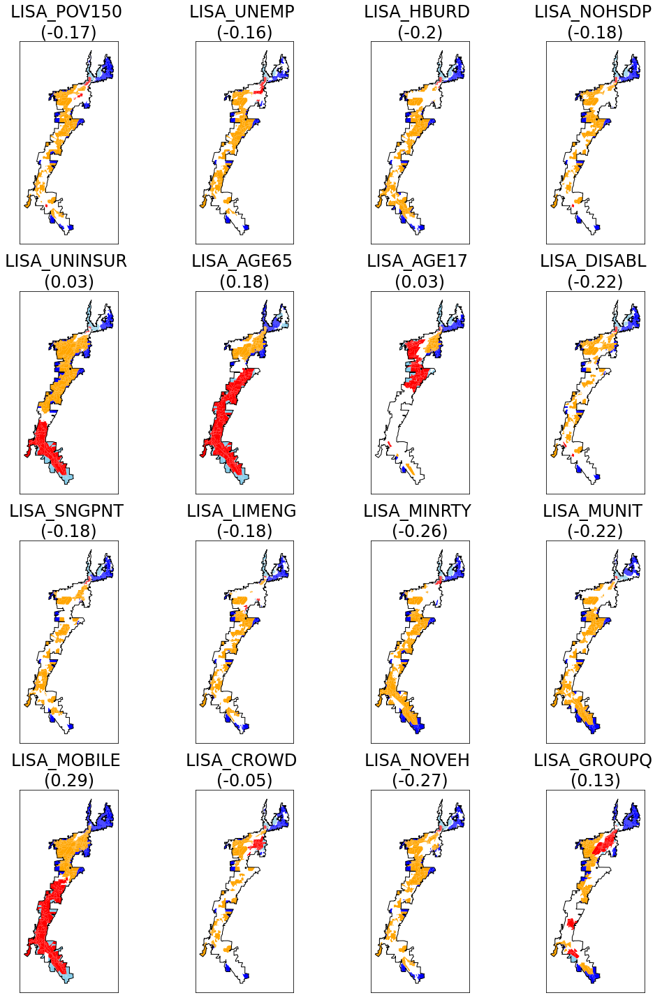

In [9]:
def plot_bivariate_moran_i_and_local_moran_i(dam_id, lm_gdf, mi_gdf):
    fig, axes = plt.subplots(4, 4, figsize=(15, 20))
    ax = axes.reshape(-1)

    # Define geography related to each dam
    dam_area = lm_gdf.loc[lm_gdf['Dam_ID'] == dam_id].reset_index()

    inund_area = dam_area.loc[dam_area['Class'] > 0]
    inund_area_union = inund_area.dissolve(by='Dam_ID')

    dam_focus = mi_gdf.loc[mi_gdf['ID'] == dam_id].reset_index()
    dam_focus = dam_focus.to_crs(epsg=5070)

    # Plot maps
    for m in range(16):
        lisa_color = {'HH': 'red', 'LL': 'blue', 'HL': 'orange', 'LH': 'skyblue', 'Not_Sig': 'white'}

        for key in lisa_color.keys():
            lm_gdf.loc[(lm_gdf[f'{plot_cols_lm[m]}'] == key) & (lm_gdf['Dam_ID'] == dam_id)].plot(ax=ax[m], color=lisa_color[key], legend=True)

        ax[m].set_title(label=f"{plot_cols_lm[m]} \n({round(dam_focus[plot_cols_mi[m]].values[0], 2)})", fontsize=24)

        inund_area_union.boundary.plot(ax=ax[m], color='black', lw=1)
        ax[m].get_xaxis().set_visible(False)
        ax[m].get_yaxis().set_visible(False)
        
    plt.tight_layout()
    plt.show()
    
lm = gpd.read_file(os.path.join(output_path, f'N_{iter_num}', 'Multi_F_lm.geojson'))
plot_bivariate_moran_i_and_local_moran_i(dam_id, lm, mi)

In [10]:
temp_lm = lm.loc[lm['Dam_ID'] == dam_id]
lisa_color = {'HH': 'red', 'LL': 'blue', 'HL': 'orange', 'LH': 'skyblue', 'Not_Sig': 'white', 'NA': 'white'}

for idx, row in temp_lm.iterrows():
    temp_lm.at[idx, 'color'] = lisa_color[row['LISA_POV150']]
#     if row['LISA_POV150'] == 'HH':
#         temp_lm.at[idx, 'color'] = lisa_color

/Users/jparkgeo/opt/anaconda3/envs/sa/lib/python3.8/site-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/var/folders/dv/bcrkszqj0634wz_17m9xw0qr0000gn/T/ipykernel_44772/1498552751.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_lm.at[idx, 'color'] = lisa_color[row['LISA_POV150']]


In [11]:
temp_lm

,EP_POV150,EP_UNEMP,EP_HBURD,EP_NOHSDP,EP_UNINSUR,EP_AGE65,EP_AGE17,EP_DISABL,EP_SNGPNT,EP_LIMENG,...,LISA_MOBILE,dist_MOBILE,LISA_CROWD,dist_CROWD,LISA_NOVEH,dist_NOVEH,LISA_GROUPQ,dist_GROUPQ,geometry,color
8575,9.507474,1.8,17.156287,7.2,2.6,18.7,18.014081,13.6,1.351351,0.81591,...,HL,25000,Not_Sig,1000,HL,1000,Not_Sig,2500,"POLYGON ((-77.73302 42.98213, -77.73302 42.982...",orange
8576,9.507474,1.8,17.156287,7.2,2.6,18.7,18.014081,13.6,1.351351,0.81591,...,HL,25000,Not_Sig,1000,HL,1000,Not_Sig,2500,"POLYGON ((-77.74360 42.98150, -77.74359 42.981...",orange
8577,9.507474,1.8,17.156287,7.2,2.6,18.7,18.014081,13.6,1.351351,0.81591,...,LL,25000,Not_Sig,1000,Not_Sig,1000,LL,2500,"POLYGON ((-77.77245 42.97501, -77.77243 42.975...",white
8578,9.507474,1.8,17.156287,7.2,2.6,18.7,18.014081,13.6,1.351351,0.81591,...,Not_Sig,25000,Not_Sig,1000,Not_Sig,1000,LL,2500,"POLYGON ((-77.79242 42.96640, -77.79242 42.966...",white
8579,9.507474,1.8,17.156287,7.2,2.6,18.7,18.014081,13.6,1.351351,0.81591,...,Not_Sig,25000,Not_Sig,1000,Not_Sig,1000,HL,2500,"POLYGON ((-77.77297 42.97206, -77.77297 42.972...",white
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10964,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NA,25000,NA,1000,NA,1000,NA,2500,"POLYGON ((-77.69346 43.10311, -77.69343 43.103...",white
10965,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NA,25000,NA,1000,NA,1000,NA,2500,"POLYGON ((-77.69602 43.10168, -77.69540 43.102...",white
10966,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NA,25000,NA,1000,NA,1000,NA,2500,"POLYGON ((-77.69916 43.10113, -77.69751 43.103...",white
10967,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NA,25000,NA,1000,NA,1000,NA,2500,"POLYGON ((-77.69602 43.10168, -77.69563 43.102...",white


In [12]:
temp_lm.explore(color=temp_lm['color'])